<a href="https://colab.research.google.com/github/arun-arunisto/OpenCVTutorial/blob/todo/ComputerVisionTutorial6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h3>Writing a video using Open-CV</h3>

In [20]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [21]:
import cv2 as cv
import matplotlib.pyplot as plt
from IPython.display import YouTubeVideo, display, HTML
from base64 import b64encode

<h3>Reading video from source</h3>

In [22]:
source = "/content/drive/MyDrive/ComputerVisionTutorial/VideosToPractise/videoplayback.mp4"
cap = cv.VideoCapture(source) #source = 0 for camera

In [23]:
#if any error happens
if not cap.isOpened():
  print("Error in opening video")

<h3>Reading and display one frame</h3>

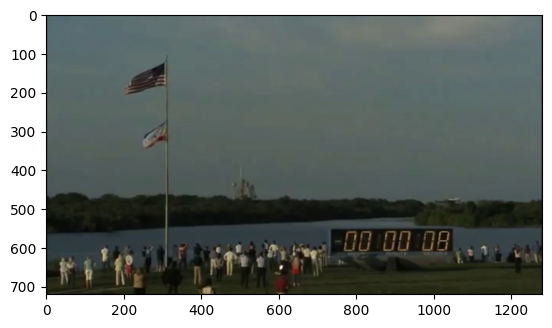

In [24]:
ret, frame = cap.read()
#showing the frame image
frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
plt.imshow(frame)

<h3>Display the YT video file from python</h3>

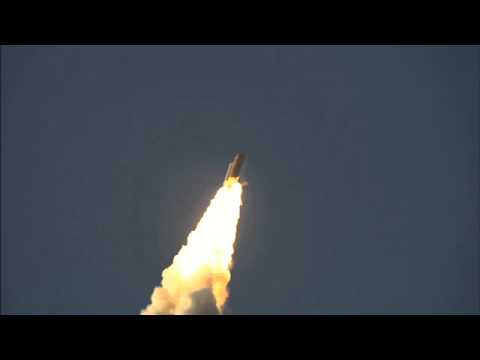

In [25]:
video = YouTubeVideo("fhYMh6KTJMQ", width=700, height=300)
display(video)

<h3>Write video using OpenCV</h3>
<p>for writing video we use <b>VideoWriter()</b> function<br>
<b>Function Syntax</b><br>
<b>object = cv2.VideoWriter(filename, fourcc, fps, frameSize)</b>
<br>
the function have 4 parameters<br>
<ol>
<li><b>filename</b> :name of the output video</li>
<li><b>fourcc</b> :4-character code of codex used to compress the frame, for example <b>VideoWriter::fourcc('P', 'I', 'M', '1')</b> is a MPEG-1 codec. <b>VideoWriter::fourcc('M', 'J', 'P', 'G')</b> is a mption-jpeg codec etc. List of codes can be obtained from video codecs by <b>FOURCC</b> page.</li>
<li><b>fps</b> :framerate of the video stream</li>
<li><b>frameSize</b> :size of the video frames</li>
</ol></p>


In [26]:
#default resolutions of the frame are obtained
#converting resolutions float to int
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

#define the codec and create videowriter object
output_avi = cv.VideoWriter("space_shuttle_launch.avi", cv.VideoWriter_fourcc("M", "J", "P", "G"), 10, (frame_width, frame_height))
output_mp4 = cv.VideoWriter("space_shuttle_launch.mp4", cv.VideoWriter_fourcc(*"XVID"), 10, (frame_width, frame_height))


<h3>Reading frames and write to file</h3>
<p>we will read the frames of the space shuttle video and write the same to the above objects that we created using <b>VideoWriter()</b> function</p>

In [27]:
#reading until video is completed
while cap.isOpened():
  #capturing frame by frame
  ret, frame = cap.read()

  if ret:
    output_avi.write(frame)
    output_mp4.write(frame)

  #if it's not True break the loop
  else:
    break

In [28]:
#after completing release VideoCapture, and VideoWriter objects
cap.release()
output_avi.release()
output_mp4.release()

<p>To display video in google colab we need to install the <b>ffmpeg</b> package. using the <b>ffmpeg</b> we are able to change the encoding of <b>.mp4</b> file from XVID to H264<br>HTML 5 can properly render videos with H264 encoding and OpenCV doesn't have that encoding. so we need to install the package</p>

In [29]:
#installing ffmpeg
!apt-get -qq install ffmpeg

<p>Currently HTML 5 supports rendering of MP4 files, so we will change the encoding of the <b>.mp4</b> file</p>

In [30]:
#change video encoding of a mp4 file from XVID to H264
!ffmpeg -y -i "/content/space_shuttle_launch.mp4" -c:v libx264 "space_shuttle_launch_x264.mp4" -hide_banner -loglevel error

<p>Rendering MP4 video</p>

In [32]:
mp4 = open("/content/space_shuttle_launch_x264.mp4", "rb").read()
data_url = "data:video/mp4;base64" + b64encode(mp4).decode()

HTML(f"""<video width=700 controls><source src="{data_url}" type="video/mp4"></video>""")